In [1]:
## -*- coding: utf-8 -*-
## Created on Wed Sep  2 20:18:23 2020
##
## @author: Bob Baggerman
##
## Plotting added by Paul Ferrill

In [39]:
from scipy.io import loadmat
import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pandas_bokeh
pandas_bokeh.output_notebook()

Loading BokehJS ...

In [4]:
from IPython.display import display
from ipywidgets import Dropdown

In [5]:
def dropdown_eventhandler(change):
    print(change.new)

In [6]:
def var_value(nasa_var, index):
    return nasa_var['data'][0][0][index][0]

In [7]:
def var_data_array_np(nasa_var):
    return nasa_var['data'][0][0][:, 0]

In [8]:
def var_rate(nasa_var):
    return nasa_var['Rate'][0][0][0][0]

In [9]:
def read_nasa_matlab(matlab_filename):
    """
    Read NASA data in matlab format and return it in a python dictionary.
    The layout of the data and various attributes are a bit involved so use
    the var_*() functions below for easy access.
    """

    # Load the Matlab data file
    nasa_mat = loadmat(matlab_filename)

    # Get rid of some unused data columns
    del nasa_mat['__header__']
    del nasa_mat['__version__']
    del nasa_mat['__globals__']
    del nasa_mat['VAR_1107']    # 1107    SYNC WORD FOR SUBFRAME 1
    del nasa_mat['VAR_2670']    # 2670    SYNC WORD FOR SUBFRAME 2
    del nasa_mat['VAR_5107']    # 5107    SYNC WORD FOR SUBFRAME 3
    del nasa_mat['VAR_6670']    # 6670    SYNC WORD FOR SUBFRAME 4
#   del nasa_mat['DVER_1']      # DVER.1  DATABASE ID VERSION CHAR 1
#   del nasa_mat['DVER_2']      # DVER.2  DATABASE ID VERSION CHAR 2
    return nasa_mat

In [10]:
def make_time_series(nasa_var):
    """ Make a pandas time series of data from the matlab data variable passed in """
    
    # Get the starting date/time
    starting_date_time = "{0}-{1:0>2}-{2:0>2} {3:0>2}:{4:0>2}:{5:0>2}".format( \
            var_value(nasa_mat['DATE_YEAR'],0), var_value(nasa_mat['DATE_MONTH'],0), var_value(nasa_mat['DATE_DAY'],0), \
            var_value(nasa_mat['GMT_HOUR'],0),  var_value(nasa_mat['GMT_MINUTE'],0), var_value(nasa_mat['GMT_SEC'],0))
    
    data_period = "{0}L".format(1000 / var_rate(nasa_var))
        
    data_array   = var_data_array_np(nasa_var)
    data_idx     = pd.date_range(start=starting_date_time, periods=data_array.size, freq=data_period)
    data_series  = pd.Series(data_array, index=data_idx)
    
    # If the sample rate is higher than 4 Hz resample down
    # Name  Rate Description
    # BLAC   16  BODY LONGITUDINAL ACCELERATION
    # CTAC   16  CROSS TRACK ACCELERATION
    # FPAC   16  FLIGHT PATH ACCELERATION
    # IVV    16  INERTIAL VERTICAL SPEED LSP
    # PTCH    8   PITCH ANGLE LSP
    # RALT    8   RADIO ALTITUDE LSP
    # ROLL    8   ROLL ANGLE LSP
    # VRTG    8   VERTICAL ACCELERATION
    if var_rate(nasa_var) > 4:
        data_series = data_series.resample('250ms').mean()
        
    return data_series

In [11]:
def data_row_valid(data_frame):
    """ 
    Return a pandas series of bools that indicate validity of a row of data 
    from the pandas data frame passed in.
    """
    
    # These are some heuristic santity checks. These are often bad with bad data.
    valid_series = \
        (data_frame['GMT_HOUR']   <  24) & (data_frame['GMT_HOUR']   >=    0) & \
        (data_frame['GMT_MINUTE'] <  60) & (data_frame['GMT_MINUTE'] >=    0) & \
        (data_frame['GMT_SEC']    <  60) & (data_frame['GMT_SEC']    >=    0) & \
        (data_frame['LATP']       <  60) & (data_frame['LATP']       >    20) & \
        (data_frame['LONP']       < -20) & (data_frame['LONP']       >  -120)
        
    return valid_series

In [12]:
def make_flight_dataframe(nasa_mat, trimmed=True):
    """ Take a matlab object of NASA data and return a pandas dataframe object
        of the same data. If trimmed is true only a range of validated data
        is returned.
    """

    # Any error will return a null frame object
    try:

        # Make a Series for each column of NASA data and put them in a list
        nasa_series = {}
        for key in nasa_mat:
            print(key, " ", end = '')
            nasa_series[key] = make_time_series(nasa_mat[key])
    #    print()
        
        # Turn the list of Series into a DataFrame
        nasa_frame = pd.DataFrame(nasa_series)
    
        # Find the limits of DataFrame rows that don't pass the sniff test
        valid_series = data_row_valid(nasa_frame)
        first_valid_data_timestamp = nasa_frame[valid_series].first_valid_index()
        last_valid_data_timestamp  = nasa_frame[valid_series].last_valid_index()
    
        # Fill in missing data between the first and last valid data points. 
        # Lat and Lon are interpolated. Everything else is forward fill.
        nasa_frame['LATP'] = nasa_frame.loc[first_valid_data_timestamp:last_valid_data_timestamp,'LATP'].interpolate()
        nasa_frame['LONP'] = nasa_frame.loc[first_valid_data_timestamp:last_valid_data_timestamp,'LONP'].interpolate()
        nasa_frame.ffill(inplace=True)
    
        if (trimmed):
            return nasa_frame[first_valid_data_timestamp:last_valid_data_timestamp]
        else:
            return nasa_frame

    # Error so return a null object
    except:
        return None

In [13]:
data_filename = "666200104011149.mat"

In [14]:
nasa_mat = read_nasa_matlab(data_filename)

In [15]:
nasa_df = make_flight_dataframe(nasa_mat, trimmed=True)

FPAC  BLAC  CTAC  TH  MH  EGT_1  EGT_2  EGT_3  EGT_4  IVV  GS  TRK  TRKM  DA  POVT  WS  MW  DFGS  WD  ALT  NSQT  RALT  ALTR  FQTY_1  OIT_1  OIT_2  AOA1  AOA2  PTCH  FF_1  PSA  FF_2  FF_3  ROLL  FF_4  N1_1  N1_2  MACH  CAS  APFD  PH  CASM  TAS  VRTG  LATG  PI  PS  N1_3  EVNT  MRK  VIB_1  PT  VHF1  VHF2  LGDN  LGUP  VIB_2  VHF3  PUSH  SHKR  MSQT_2  VIB_3  LONG  PLA_1  N1_4  HYDY  HYDG  SMOK  CALT  VIB_4  PLA_2  PLA_3  PLA_4  GMT_HOUR  GMT_MINUTE  GMT_SEC  ACMT  FQTY_2  OIT_3  OIT_4  DATE_YEAR  DATE_MONTH  DATE_DAY  DVER_1  ACID  BLV  EAI  PACK  AOAI  AOAC  BAL1  APUF  TOCW  BAL2  WSHR  WOW  N2_1  N2_2  N2_3  N2_4  TAT  SAT  N1T  N1C  RUDD  FQTY_3  OIP_1  OIP_2  FQTY_4  CRSS  HDGS  ALTS  SNAP  CASS  N1CO  VSPS  MNS  MSQT_1  VMODE  LMOD  A_T  CCPC  CCPF  RUDP  CWPC  CWPF  OIP_3  OIP_4  LOC  GLS  LONP  ABRK  AIL_1  AIL_2  SPL_1  SPL_2  ESN_4  ECYC_1  ECYC_2  ELEV_1  ELEV_2  FLAP  PTRM  HF1  HF2  SMKB  SPLY  SPLG  FRMC  DVER_2  ESN_3  BPGR_1  BPGR_2  BPYR_1  BPYR_2  ECYC_3  ECYC_4  EHRS_1  T

In [16]:
nasa_df

,FPAC,BLAC,CTAC,TH,MH,EGT_1,EGT_2,EGT_3,EGT_4,IVV,...,ATEN,LATP,FIRE_1,FIRE_2,FIRE_3,FIRE_4,FGC3,ILSF,ESN_1,ESN_2
2001-04-01 11:48:36.000,-0.000244,-0.000489,0.000000,50.244473,58.077492,74.5,77.0,89.5,87.0,0.50,...,0.0,40.408061,0.0,0.0,0.0,0.0,120.0,2255973.0,7786.0,7691.0
2001-04-01 11:48:36.250,0.000000,-0.009526,0.000000,50.244473,58.077492,74.5,77.0,89.5,87.0,-0.25,...,0.0,40.408061,0.0,0.0,0.0,0.0,120.0,2255973.0,7786.0,7691.0
2001-04-01 11:48:36.500,0.000000,-0.004641,0.000000,50.244473,58.077492,75.0,77.0,89.5,87.0,0.00,...,0.0,40.408061,0.0,0.0,0.0,0.0,120.0,2255973.0,7786.0,7691.0
2001-04-01 11:48:36.750,-0.000977,0.003175,-0.000733,50.244473,58.077492,75.0,77.0,89.5,87.0,-0.25,...,0.0,40.408061,0.0,0.0,0.0,0.0,120.0,2255973.0,7786.0,7691.0
2001-04-01 11:48:37.000,-0.000977,0.002931,-0.000977,50.244473,58.077492,75.0,77.5,89.5,88.0,1.00,...,0.0,40.408061,0.0,0.0,0.0,0.0,120.0,2255973.0,7786.0,7691.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2001-04-01 13:57:06.000,0.000000,0.000000,0.000000,0.000000,0.000000,274.5,243.0,265.0,285.0,0.00,...,0.0,44.881557,0.0,0.0,0.0,0.0,112.0,2157669.0,7786.0,7691.0
2001-04-01 13:57:06.250,0.000000,0.000000,0.000000,0.000000,0.000000,274.5,243.0,265.0,285.0,0.00,...,0.0,44.881557,0.0,0.0,0.0,0.0,112.0,2157669.0,7786.0,7691.0
2001-04-01 13:57:06.500,0.000000,0.000000,0.000000,0.000000,0.000000,274.5,243.0,264.0,285.0,0.00,...,0.0,44.881557,0.0,0.0,0.0,0.0,112.0,2157669.0,7786.0,7691.0
2001-04-01 13:57:06.750,0.000000,0.000000,0.000000,0.000000,0.000000,274.5,243.0,264.0,284.0,0.00,...,0.0,44.881557,0.0,0.0,0.0,0.0,112.0,2157669.0,7786.0,7691.0


In [17]:
dropdown = Dropdown(description="Choose one:", options=sorted(nasa_df.columns))
dropdown.observe(dropdown_eventhandler, names='value')
display(dropdown)

Dropdown(description='Choose one:', options=('ABRK', 'ACID', 'ACMT', 'AIL_1', 'AIL_2', 'ALT', 'ALTR', 'ALTS', …

EGT_1
EGT_2


In [44]:
nasa_df.plot_bokeh(y=dropdown.value)

Figure(id='2937', ...)

In [41]:
nasa_df.plot_bokeh(y='ALT')

Figure(id='1926', ...)

In [42]:
nasa_df.plot_bokeh(y=['EGT_1','EGT_2','EGT_3','EGT_4'])

Figure(id='2144', ...)

In [43]:
nasa_df.plot_bokeh(y=['OIT_1','OIT_2','OIT_3','OIT_4'])

Figure(id='2527', ...)

In [22]:
OIT1 = nasa_mat['OIT_1'][0][0][0]
OIT2 = nasa_mat['OIT_2'][0][0][0]
OIT3 = nasa_mat['OIT_3'][0][0][0]
OIT4 = nasa_mat['OIT_4'][0][0][0]

In [23]:
# Need to cleanup the dataframes to remove the negative values
df1 = pd.DataFrame(data=OIT1)
df1 = df1[(df1.T > 0).any()]
df2 = pd.DataFrame(data=OIT2)
df2 = df2[(df2.T > 0).any()]
df3 = pd.DataFrame(data=OIT3)
df3 = df3[(df3.T > 0).any()]
df4 = pd.DataFrame(data=OIT4)
df4 = df4[(df4.T > 0).any()]

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …
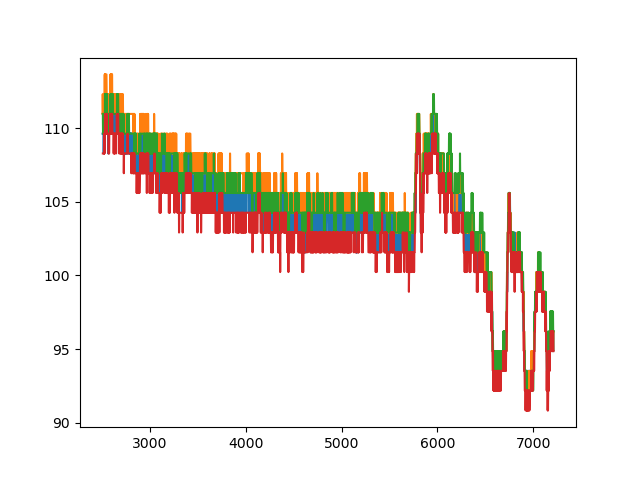

In [24]:
fig,ax = plt.subplots()
ax.plot(df1[2500:-500])
ax.plot(df2[2500:-500])
ax.plot(df3[2500:-500])
ax.plot(df4[2500:-500])
plt.show()

In [25]:
OIP1 = nasa_mat['OIP_1'][0][0][0]
OIP2 = nasa_mat['OIP_2'][0][0][0]
OIP3 = nasa_mat['OIP_3'][0][0][0]
OIP4 = nasa_mat['OIP_4'][0][0][0]

In [26]:
# Need to cleanup the dataframes to remove the negative values
df1 = pd.DataFrame(data=OIP1)
df1 = df1[(df1.T > 0).any()]
df2 = pd.DataFrame(data=OIP2)
df2 = df2[(df2.T > 0).any()]
df3 = pd.DataFrame(data=OIP3)
df3 = df3[(df3.T > 0).any()]
df4 = pd.DataFrame(data=OIP4)
df4 = df4[(df4.T > 0).any()]

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …
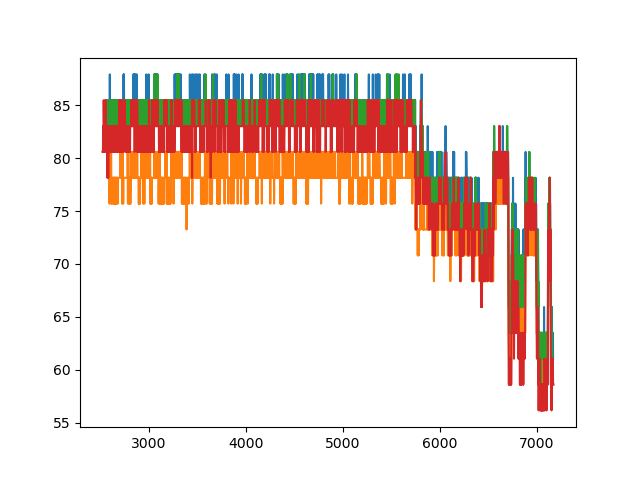

In [27]:
fig,ax = plt.subplots()
ax.plot(df1[2500:-500])
ax.plot(df2[2500:-500])
ax.plot(df3[2500:-500])
ax.plot(df4[2500:-500])
plt.show()

In [28]:
N1_1 = nasa_mat['N1_1'][0][0][0]
N1_2 = nasa_mat['N1_2'][0][0][0]
N1_3 = nasa_mat['N1_3'][0][0][0]
N1_4 = nasa_mat['N1_4'][0][0][0]

In [29]:
plt.plot(N1_1[22500:])

In [30]:
FF1 = nasa_mat['FF_1'][0][0][0]
FF2 = nasa_mat['FF_2'][0][0][0]
FF3 = nasa_mat['FF_3'][0][0][0]
FF4 = nasa_mat['FF_4'][0][0][0]

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …
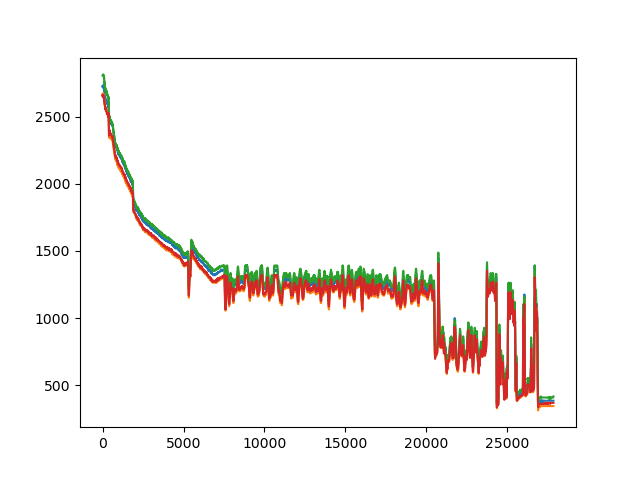

In [31]:
fig,ax = plt.subplots()
ax.plot(FF1[2500:-500])
ax.plot(FF2[2500:-500])
ax.plot(FF3[2500:-500])
ax.plot(FF4[2500:-500])
plt.show()